In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn.preprocessing as preprocessing
import sklearn.metrics as metrics
import sklearn.model_selection as model_selection
import seaborn as sns
%matplotlib inline

In [3]:
from sklearn.datasets import load_breast_cancer
dataset = load_breast_cancer()
df = pd.DataFrame(dataset.data, columns=dataset.feature_names)

In [5]:
ref = {k:v for k,v in enumerate(dataset.target_names[::-1])}

In [6]:
df['survived'] = dataset.target

In [7]:
df['tumor'] = df['survived'].map(ref)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
mean radius                569 non-null float64
mean texture               569 non-null float64
mean perimeter             569 non-null float64
mean area                  569 non-null float64
mean smoothness            569 non-null float64
mean compactness           569 non-null float64
mean concavity             569 non-null float64
mean concave points        569 non-null float64
mean symmetry              569 non-null float64
mean fractal dimension     569 non-null float64
radius error               569 non-null float64
texture error              569 non-null float64
perimeter error            569 non-null float64
area error                 569 non-null float64
smoothness error           569 non-null float64
compactness error          569 non-null float64
concavity error            569 non-null float64
concave points error       569 non-null float64
symmetry error             569 

In [7]:
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,survived,tumor
0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.300100,0.147100,0.2419,0.07871,...,184.60,2019.0,0.16220,0.66560,0.71190,0.26540,0.4601,0.11890,0,benign
1,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.086900,0.070170,0.1812,0.05667,...,158.80,1956.0,0.12380,0.18660,0.24160,0.18600,0.2750,0.08902,0,benign
2,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.197400,0.127900,0.2069,0.05999,...,152.50,1709.0,0.14440,0.42450,0.45040,0.24300,0.3613,0.08758,0,benign
3,11.420,20.38,77.58,386.1,0.14250,0.28390,0.241400,0.105200,0.2597,0.09744,...,98.87,567.7,0.20980,0.86630,0.68690,0.25750,0.6638,0.17300,0,benign
4,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.198000,0.104300,0.1809,0.05883,...,152.20,1575.0,0.13740,0.20500,0.40000,0.16250,0.2364,0.07678,0,benign
5,12.450,15.70,82.57,477.1,0.12780,0.17000,0.157800,0.080890,0.2087,0.07613,...,103.40,741.6,0.17910,0.52490,0.53550,0.17410,0.3985,0.12440,0,benign
6,18.250,19.98,119.60,1040.0,0.09463,0.10900,0.112700,0.074000,0.1794,0.05742,...,153.20,1606.0,0.14420,0.25760,0.37840,0.19320,0.3063,0.08368,0,benign
7,13.710,20.83,90.20,577.9,0.11890,0.16450,0.093660,0.059850,0.2196,0.07451,...,110.60,897.0,0.16540,0.36820,0.26780,0.15560,0.3196,0.11510,0,benign
8,13.000,21.82,87.50,519.8,0.12730,0.19320,0.185900,0.093530,0.2350,0.07389,...,106.20,739.3,0.17030,0.54010,0.53900,0.20600,0.4378,0.10720,0,benign
9,12.460,24.04,83.97,475.9,0.11860,0.23960,0.227300,0.085430,0.2030,0.08243,...,97.65,711.4,0.18530,1.05800,1.10500,0.22100,0.4366,0.20750,0,benign


In [35]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,survived
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


/anaconda3/envs/base_py36/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda3/envs/base_py36/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/anaconda3/envs/base_py36/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/anaconda3/envs/base_py36/lib/python3.6/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, *

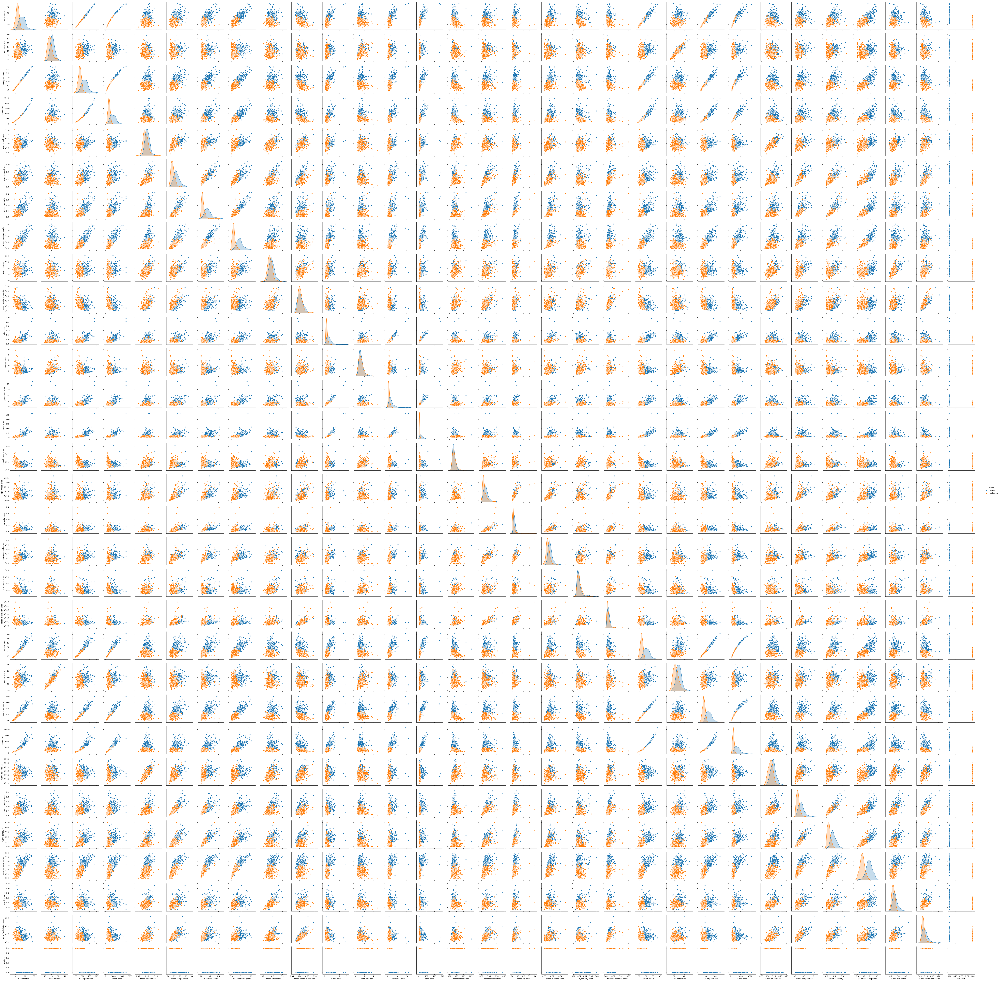

In [15]:
sns.pairplot(df, hue='tumor')

# KMean Clustering

In [16]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture as GMM

In [17]:
df.columns

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'survived', 'tumor'],
      dtype='object')

In [18]:
X = df[['worst concavity', 'worst concave points']]
y = df['survived']

In [23]:
km = KMeans(n_clusters=2)
km.fit(X)
y_pred = km.predict(X)
centroids = km.cluster_centers_

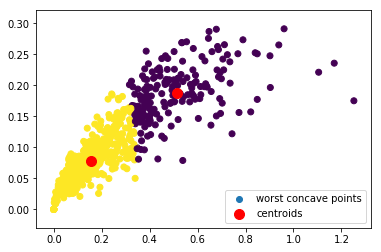

In [25]:
plt.scatter(X.iloc[:,0], X.iloc[:,1], c=y_pred)
plt.scatter(centroids[:,0], centroids[:,1], c='r', s=[100], label='centroids')
plt.legend(loc='best')
plt.show()

In [28]:
pd.crosstab(y, y_pred,colnames=['Prediction'])

Prediction,0,1
survived,,
0,158,54
1,28,329


In [29]:
metrics.accuracy_score(y, y_pred)

0.8558875219683656

# GMM

In [41]:
gmm = GMM(n_components=2)
gmm.fit(X)
y_pred = gmm.predict(X)

In [42]:
pd.crosstab(y, y_pred)

col_0,0,1
survived,,
0,62,150
1,329,28


In [43]:
y_pred = pd.DataFrame(y_pred).replace({0:1,1:0}).values

In [45]:
pd.crosstab(y, y_pred.ravel(),colnames=['Prediction'])

Prediction,0,1
survived,,
0,150,62
1,28,329


In [46]:
metrics.accuracy_score(y, y_pred)

0.8418277680140598

# Linear Regression

In [48]:
from sklearn.linear_model import LinearRegression
X, y = df[['worst concavity']], df['worst concave points']

In [49]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.3, random_state=42)

In [50]:
lin_r = LinearRegression()
lin_r.fit(X_train, y_train)
y_pred = lin_r.predict(X_test)

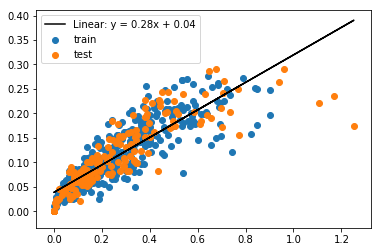

In [54]:
plt.scatter(X_train, y_train, label='train')
plt.scatter(X_test, y_test, label = 'test')
plt.plot(X_test, y_pred, c='k', label = 'Linear: y = {:.2f}x + {:.2f}'.format(lin_r.coef_[0], lin_r.intercept_))
plt.legend(loc='best')
plt.show()

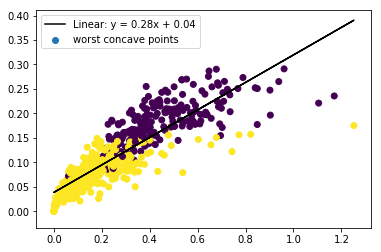

In [55]:
plt.scatter(X, y, c=df.survived)
plt.plot(X_test, y_pred, c='k', label = 'Linear: y = {:.2f}x + {:.2f}'.format(lin_r.coef_[0], lin_r.intercept_))
plt.legend(loc='best')
plt.show()

In [57]:
metrics.r2_score(y_test, y_pred)

0.7005572038174026

# Data preprocessing for ML models

In [77]:
X = df.iloc[:,:-2]
y = df.iloc[:,-2]

In [78]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.3, random_state=42)

In [79]:
scaler = preprocessing.StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Logistic Regression

In [80]:
def train_and_evaluate(estimator, X_train, y_train, X_test, y_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return metrics.accuracy_score(y_test, y_pred)

In [81]:
from sklearn.linear_model import LogisticRegression
log_r = LogisticRegression()
train_and_evaluate(log_r, X_train, y_train, X_test, y_test)

0.9824561403508771

In [82]:
from sklearn.linear_model import LogisticRegressionCV
lg_cv = LogisticRegressionCV()
train_and_evaluate(lg_cv, X_train, y_train, X_test, y_test)

0.9941520467836257

# Decision Tree

In [83]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
train_and_evaluate(dt, X_train, y_train, X_test, y_test)

0.9298245614035088

# Random Forest

In [84]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
rf = RandomForestClassifier()
train_and_evaluate(rf, X_train, y_train, X_test, y_test)

0.9532163742690059

In [85]:
abc = AdaBoostClassifier()
train_and_evaluate(abc, X_train, y_train, X_test, y_test)

0.9766081871345029

# SVM

In [86]:
from sklearn.svm import LinearSVC, SVC
lin_svm = LinearSVC()
train_and_evaluate(lin_svm, X_train, y_train, X_test, y_test)

0.9766081871345029

In [87]:
svc = SVC()
train_and_evaluate(svc, X_train, y_train, X_test, y_test)

0.9766081871345029

# Naive Bayes

In [88]:
from sklearn.naive_bayes import BernoulliNB, GaussianNB

In [89]:
bnb = BernoulliNB()
train_and_evaluate(bnb, X_train, y_train, X_test, y_test)

0.9649122807017544

In [90]:
gnb = GaussianNB()
train_and_evaluate(gnb, X_train, y_train, X_test, y_test)

0.935672514619883

# KNN

In [91]:
from sklearn.neighbors import KNeighborsClassifier

In [92]:
knn = KNeighborsClassifier()
train_and_evaluate(knn, X_train, y_train, X_test, y_test)

0.9590643274853801

# use tf.estimator

In [26]:
X, y = df.drop(['survived','tumor'],1), df['survived']

In [27]:
# very good to replace invalid col names by python valid name for tf operations
X.columns = X.columns.str.replace(' ', '_')

In [28]:
import tensorflow as tf

In [29]:
feat_cols = [tf.feature_column.numeric_column(key) for key in X.columns]

In [30]:
for i in X.columns:
    X[i] = (X[i]-X[i].mean())/X[i].std()

In [31]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [32]:
model = tf.estimator.LinearClassifier(feat_cols,optimizer='Adam')

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': '/var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmpbma_a3uk', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x1a2d669588>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [33]:
input_func = tf.estimator.inputs.pandas_input_fn(X_train, y_train, batch_size=32, num_epochs=1000, shuffle=True)

In [34]:
model.train(input_func,steps=5000)

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmpbma_a3uk/model.ckpt.
INFO:tensorflow:loss = 22.18071, step = 1
INFO:tensorflow:global_step/sec: 174.121
INFO:tensorflow:loss = 0.1338873, step = 101 (0.578 sec)
INFO:tensorflow:global_step/sec: 269.643
INFO:tensorflow:loss = 2.5088792, step = 201 (0.368 sec)
INFO:tensorflow:global_step/sec: 258.118
INFO:tensorflow:loss = 1.9796227, step = 301 (0.388 sec)
INFO:tensorflow:global_step/sec: 260.042
INFO:tensorflow:loss = 0.48283786, step = 401 (0.385 sec)
INFO:tensorflow:global_step/sec: 258.646
INFO:tensorflow:loss = 2.3308628, step = 501 (0.389 sec)
INFO:tensorflow:global_step/sec: 258.334
INFO:tensorflow:loss = 1.146582, step = 601 (0.387 sec)
INFO:tensorflo

In [35]:
eval_func = tf.estimator.inputs.pandas_input_fn(X_test, y_test, num_epochs=1, shuffle=False, batch_size=32)

In [36]:
model.evaluate(eval_func)

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-10-21-04:47:04
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmpbma_a3uk/model.ckpt-5000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-10-21-04:47:05
INFO:tensorflow:Saving dict for global step 5000: accuracy = 0.93085104, accuracy_baseline = 0.64361703, auc = 0.97261626, auc_precision_recall = 0.98762393, average_loss = 0.5656233, global_step = 5000, label/mean = 0.64361703, loss = 17.722864, precision = 0.9736842, prediction/mean = 0.6105262, recall = 0.91735536
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5000: /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmpbma_a3uk/model.ckpt-5000


{'accuracy': 0.93085104,
 'accuracy_baseline': 0.64361703,
 'auc': 0.97261626,
 'auc_precision_recall': 0.98762393,
 'average_loss': 0.5656233,
 'label/mean': 0.64361703,
 'loss': 17.722864,
 'precision': 0.9736842,
 'prediction/mean': 0.6105262,
 'recall': 0.91735536,
 'global_step': 5000}

# Use Keras

In [8]:
X, y = df.drop(['survived','tumor'],1), df['survived']

In [11]:
X.columns = X.columns.str.replace(' ', '_')

In [13]:
for i in X.columns:
    X[i] = (X[i]-X[i].mean())/X[i].std()

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [14]:
X.shape

(569, 30)

In [30]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasClassifier

In [22]:
clf_dnn = Sequential()
clf_dnn.add(Dense(8, activation='relu', input_shape=(30,)))
clf_dnn.add(Dropout(0.2))
clf_dnn.add(Dense(8, activation='relu'))
clf_dnn.add(Dropout(0.2))
clf_dnn.add(Dense(1, activation='sigmoid'))

In [26]:
clf_dnn.compile(optimizer='Adam',loss='binary_crossentropy',metrics=['accuracy'])

In [27]:
clf_dnn.fit(X_train, y_train, batch_size=32, epochs=1000)

Epoch 1/1000
381/381 [==============================] - 0s 1ms/step - loss: 0.9091 - acc: 0.4094
Epoch 2/1000
381/381 [==============================] - 0s 46us/step - loss: 0.7732 - acc: 0.5932
Epoch 3/1000
381/381 [==============================] - 0s 50us/step - loss: 0.6871 - acc: 0.6535
Epoch 4/1000
381/381 [==============================] - 0s 45us/step - loss: 0.6070 - acc: 0.7008
Epoch 5/1000
381/381 [==============================] - 0s 49us/step - loss: 0.6008 - acc: 0.7060
Epoch 6/1000
381/381 [==============================] - 0s 48us/step - loss: 0.5452 - acc: 0.7428
Epoch 7/1000
381/381 [==============================] - 0s 45us/step - loss: 0.5323 - acc: 0.7323
Epoch 8/1000
381/381 [==============================] - 0s 51us/step - loss: 0.4820 - acc: 0.7795
Epoch 9/1000
381/381 [==============================] - 0s 48us/step - loss: 0.4749 - acc: 0.7533
Epoch 10/1000
381/381 [==============================] - 0s 49us/step - loss: 0.4703 - acc: 0.7585
Epoch 11/1000
381/38

381/381 [==============================] - 0s 48us/step - loss: 0.0473 - acc: 0.9869
Epoch 166/1000
381/381 [==============================] - 0s 44us/step - loss: 0.0559 - acc: 0.9869
Epoch 167/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0413 - acc: 0.9895
Epoch 168/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0588 - acc: 0.9869
Epoch 169/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0542 - acc: 0.9790
Epoch 170/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0501 - acc: 0.9869
Epoch 171/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0631 - acc: 0.9659
Epoch 172/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0510 - acc: 0.9869
Epoch 173/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0520 - acc: 0.9843
Epoch 174/1000
381/381 [==============================] - 0s 52us/step - loss: 0.0515 - acc: 0.9816
Epoch 175/1000


381/381 [==============================] - 0s 49us/step - loss: 0.0436 - acc: 0.9843
Epoch 248/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0417 - acc: 0.9895
Epoch 249/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0278 - acc: 0.9895
Epoch 250/1000
381/381 [==============================] - 0s 52us/step - loss: 0.0366 - acc: 0.9895
Epoch 251/1000
381/381 [==============================] - 0s 54us/step - loss: 0.0377 - acc: 0.9974
Epoch 252/1000
381/381 [==============================] - 0s 54us/step - loss: 0.0240 - acc: 0.9948
Epoch 253/1000
381/381 [==============================] - 0s 62us/step - loss: 0.0466 - acc: 0.9869
Epoch 254/1000
381/381 [==============================] - 0s 58us/step - loss: 0.0329 - acc: 0.9816
Epoch 255/1000
381/381 [==============================] - 0s 54us/step - loss: 0.0338 - acc: 0.9948
Epoch 256/1000
381/381 [==============================] - 0s 51us/step - loss: 0.0571 - acc: 0.9843
Epoch 257/1000


381/381 [==============================] - 0s 46us/step - loss: 0.0744 - acc: 0.9869
Epoch 330/1000
381/381 [==============================] - 0s 51us/step - loss: 0.0271 - acc: 0.9974
Epoch 331/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0230 - acc: 0.9895
Epoch 332/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0214 - acc: 0.9921
Epoch 333/1000
381/381 [==============================] - 0s 52us/step - loss: 0.0228 - acc: 0.9869
Epoch 334/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0256 - acc: 0.9921
Epoch 335/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0317 - acc: 0.9895
Epoch 336/1000
381/381 [==============================] - 0s 54us/step - loss: 0.0296 - acc: 0.9948
Epoch 337/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0264 - acc: 0.9921
Epoch 338/1000
381/381 [==============================] - 0s 51us/step - loss: 0.0303 - acc: 0.9843
Epoch 339/1000


381/381 [==============================] - 0s 46us/step - loss: 0.0203 - acc: 0.9974
Epoch 412/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0148 - acc: 0.9948
Epoch 413/1000
381/381 [==============================] - 0s 44us/step - loss: 0.0245 - acc: 0.9921
Epoch 414/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0642 - acc: 0.9921
Epoch 415/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0156 - acc: 0.9974
Epoch 416/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0324 - acc: 0.9921
Epoch 417/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0259 - acc: 0.9869
Epoch 418/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0232 - acc: 0.9948
Epoch 419/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0201 - acc: 0.9974
Epoch 420/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0298 - acc: 0.9921
Epoch 421/1000


381/381 [==============================] - 0s 41us/step - loss: 0.0232 - acc: 0.9948
Epoch 494/1000
381/381 [==============================] - 0s 38us/step - loss: 0.0207 - acc: 0.9948
Epoch 495/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0285 - acc: 0.9921
Epoch 496/1000
381/381 [==============================] - 0s 43us/step - loss: 0.0136 - acc: 1.0000
Epoch 497/1000
381/381 [==============================] - 0s 43us/step - loss: 0.0243 - acc: 0.9921
Epoch 498/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0158 - acc: 0.9948
Epoch 499/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0166 - acc: 0.9974
Epoch 500/1000
381/381 [==============================] - 0s 57us/step - loss: 0.0206 - acc: 0.9948
Epoch 501/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0125 - acc: 0.9974
Epoch 502/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0136 - acc: 0.9974
Epoch 503/1000


381/381 [==============================] - 0s 49us/step - loss: 0.0181 - acc: 0.9948
Epoch 576/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0095 - acc: 0.9974
Epoch 577/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0579 - acc: 0.9921
Epoch 578/1000
381/381 [==============================] - 0s 44us/step - loss: 0.0084 - acc: 1.0000
Epoch 579/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0373 - acc: 0.9895
Epoch 580/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0197 - acc: 0.9948
Epoch 581/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0197 - acc: 0.9895
Epoch 582/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0162 - acc: 0.9948
Epoch 583/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0072 - acc: 1.0000
Epoch 584/1000
381/381 [==============================] - 0s 52us/step - loss: 0.0147 - acc: 0.9921
Epoch 585/1000


381/381 [==============================] - 0s 48us/step - loss: 0.0102 - acc: 0.9974
Epoch 658/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0100 - acc: 0.9974
Epoch 659/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0106 - acc: 1.0000
Epoch 660/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0118 - acc: 1.0000
Epoch 661/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0162 - acc: 0.9921
Epoch 662/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0078 - acc: 1.0000
Epoch 663/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0201 - acc: 0.9948
Epoch 664/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0081 - acc: 1.0000
Epoch 665/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0164 - acc: 0.9948
Epoch 666/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0272 - acc: 0.9948
Epoch 667/1000


381/381 [==============================] - 0s 49us/step - loss: 0.0183 - acc: 0.9948
Epoch 740/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0174 - acc: 0.9921
Epoch 741/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0074 - acc: 1.0000
Epoch 742/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0081 - acc: 0.9974
Epoch 743/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0087 - acc: 0.9974
Epoch 744/1000
381/381 [==============================] - 0s 47us/step - loss: 0.0178 - acc: 0.9974
Epoch 745/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0059 - acc: 1.0000
Epoch 746/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0061 - acc: 1.0000
Epoch 747/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0152 - acc: 0.9974
Epoch 748/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0145 - acc: 0.9948
Epoch 749/1000


381/381 [==============================] - 0s 43us/step - loss: 0.0327 - acc: 0.9869
Epoch 822/1000
381/381 [==============================] - 0s 43us/step - loss: 0.0152 - acc: 0.9948
Epoch 823/1000
381/381 [==============================] - 0s 43us/step - loss: 0.0044 - acc: 1.0000
Epoch 824/1000
381/381 [==============================] - 0s 42us/step - loss: 0.0062 - acc: 0.9974
Epoch 825/1000
381/381 [==============================] - 0s 42us/step - loss: 0.0064 - acc: 0.9974
Epoch 826/1000
381/381 [==============================] - 0s 42us/step - loss: 0.0078 - acc: 1.0000
Epoch 827/1000
381/381 [==============================] - 0s 39us/step - loss: 0.0100 - acc: 1.0000
Epoch 828/1000
381/381 [==============================] - 0s 46us/step - loss: 0.0169 - acc: 0.9948
Epoch 829/1000
381/381 [==============================] - 0s 42us/step - loss: 0.0070 - acc: 1.0000
Epoch 830/1000
381/381 [==============================] - 0s 45us/step - loss: 0.0544 - acc: 0.9921
Epoch 831/1000


381/381 [==============================] - 0s 50us/step - loss: 0.0052 - acc: 1.0000
Epoch 904/1000
381/381 [==============================] - 0s 51us/step - loss: 0.0038 - acc: 1.0000
Epoch 905/1000
381/381 [==============================] - 0s 53us/step - loss: 0.0092 - acc: 0.9974
Epoch 906/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0239 - acc: 0.9921
Epoch 907/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0064 - acc: 1.0000
Epoch 908/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0071 - acc: 0.9974
Epoch 909/1000
381/381 [==============================] - 0s 51us/step - loss: 0.0116 - acc: 0.9974
Epoch 910/1000
381/381 [==============================] - 0s 56us/step - loss: 0.0034 - acc: 1.0000
Epoch 911/1000
381/381 [==============================] - 0s 57us/step - loss: 0.0047 - acc: 1.0000
Epoch 912/1000
381/381 [==============================] - 0s 53us/step - loss: 0.0028 - acc: 1.0000
Epoch 913/1000


381/381 [==============================] - 0s 57us/step - loss: 0.0088 - acc: 0.9974
Epoch 986/1000
381/381 [==============================] - 0s 56us/step - loss: 0.0049 - acc: 1.0000
Epoch 987/1000
381/381 [==============================] - 0s 55us/step - loss: 0.0057 - acc: 1.0000
Epoch 988/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0153 - acc: 0.9948
Epoch 989/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0048 - acc: 1.0000
Epoch 990/1000
381/381 [==============================] - 0s 48us/step - loss: 0.0040 - acc: 1.0000
Epoch 991/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0160 - acc: 0.9948
Epoch 992/1000
381/381 [==============================] - 0s 50us/step - loss: 0.0040 - acc: 1.0000
Epoch 993/1000
381/381 [==============================] - 0s 51us/step - loss: 0.0046 - acc: 1.0000
Epoch 994/1000
381/381 [==============================] - 0s 49us/step - loss: 0.0119 - acc: 0.9948
Epoch 995/1000


In [28]:
clf_dnn.evaluate(X_test, y_test, batch_size=32)

188/188 [==============================] - 0s 304us/step


[0.29975642491208804, 0.978723406791687]

In [29]:
from sklearn.model_selection import cross_val_score, GridSearchCV

In [42]:
def build_func(optimizer):
    clf = Sequential()
    clf.add(Dense(8, activation='relu', input_shape=(30,)))
    clf.add(Dropout(0.2))
    clf.add(Dense(8, activation='relu'))
    clf.add(Dropout(0.2))
    clf.add(Dense(1, activation='sigmoid'))
    clf.compile(optimizer=optimizer,loss='binary_crossentropy',metrics=['accuracy'])
    return clf

In [43]:
clf_dnn_cv = KerasClassifier(build_fn=build_func('adam'), batch_size=32, epochs=100)

In [44]:
# cv_scores = cross_val_score(clf_dnn_cv, X_train, y=y_train, scoring='accuracy', cv=10)

TypeError: can't pickle _thread.RLock objects

In [45]:
parameters = {'optimizer':['adam', 'rmsprop'],
              'batch_size':[10,32], 
              'epochs':[100,500]
              }
clf_grid = KerasClassifier(build_fn = build_func)
# gridsearchcv has cv as a argument
gridsearch = GridSearchCV(estimator=clf_grid, param_grid = parameters, scoring = 'accuracy')
gridsearch = gridsearch.fit(X_train, y_train)

Epoch 1/100
254/254 [==============================] - 1s 2ms/step - loss: 0.9646 - acc: 0.3110
Epoch 2/100
254/254 [==============================] - 0s 156us/step - loss: 0.7731 - acc: 0.5512
Epoch 3/100
254/254 [==============================] - 0s 157us/step - loss: 0.6901 - acc: 0.6378
Epoch 4/100
254/254 [==============================] - 0s 163us/step - loss: 0.6079 - acc: 0.7283
Epoch 5/100
254/254 [==============================] - 0s 159us/step - loss: 0.5054 - acc: 0.8386
Epoch 6/100
254/254 [==============================] - 0s 160us/step - loss: 0.4923 - acc: 0.8346
Epoch 7/100
254/254 [==============================] - 0s 152us/step - loss: 0.4708 - acc: 0.8465
Epoch 8/100
254/254 [==============================] - 0s 178us/step - loss: 0.4216 - acc: 0.8819
Epoch 9/100
254/254 [==============================] - 0s 162us/step - loss: 0.3799 - acc: 0.9252
Epoch 10/100
254/254 [==============================] - 0s 168us/step - loss: 0.3433 - acc: 0.9331
Epoch 11/100
254/254 

Epoch 66/100
254/254 [==============================] - 0s 156us/step - loss: 0.0783 - acc: 0.9764
Epoch 67/100
254/254 [==============================] - 0s 148us/step - loss: 0.0903 - acc: 0.9646
Epoch 68/100
254/254 [==============================] - 0s 173us/step - loss: 0.0814 - acc: 0.9843
Epoch 69/100
254/254 [==============================] - 0s 164us/step - loss: 0.0612 - acc: 0.9764
Epoch 70/100
254/254 [==============================] - 0s 154us/step - loss: 0.0806 - acc: 0.9724
Epoch 71/100
254/254 [==============================] - 0s 149us/step - loss: 0.0669 - acc: 0.9803
Epoch 72/100
254/254 [==============================] - 0s 150us/step - loss: 0.0871 - acc: 0.9567
Epoch 73/100
254/254 [==============================] - 0s 148us/step - loss: 0.0864 - acc: 0.9724
Epoch 74/100
254/254 [==============================] - 0s 140us/step - loss: 0.0864 - acc: 0.9606
Epoch 75/100
254/254 [==============================] - 0s 145us/step - loss: 0.0717 - acc: 0.9685
Epoch 76/1

Epoch 31/100
254/254 [==============================] - 0s 136us/step - loss: 0.0701 - acc: 0.9803
Epoch 32/100
254/254 [==============================] - 0s 136us/step - loss: 0.0753 - acc: 0.9646
Epoch 33/100
254/254 [==============================] - 0s 151us/step - loss: 0.0775 - acc: 0.9843
Epoch 34/100
254/254 [==============================] - 0s 141us/step - loss: 0.0747 - acc: 0.9764
Epoch 35/100
254/254 [==============================] - 0s 144us/step - loss: 0.0721 - acc: 0.9724
Epoch 36/100
254/254 [==============================] - 0s 140us/step - loss: 0.0775 - acc: 0.9724
Epoch 37/100
254/254 [==============================] - 0s 137us/step - loss: 0.0744 - acc: 0.9803
Epoch 38/100
254/254 [==============================] - 0s 136us/step - loss: 0.0671 - acc: 0.9803
Epoch 39/100
254/254 [==============================] - 0s 130us/step - loss: 0.0543 - acc: 0.9803
Epoch 40/100
254/254 [==============================] - 0s 128us/step - loss: 0.0562 - acc: 0.9882
Epoch 41/1

254/254 [==============================] - 0s 132us/step - loss: 0.0698 - acc: 0.9724
Epoch 96/100
254/254 [==============================] - 0s 147us/step - loss: 0.0620 - acc: 0.9882
Epoch 97/100
254/254 [==============================] - 0s 137us/step - loss: 0.0672 - acc: 0.9843
Epoch 98/100
254/254 [==============================] - 0s 132us/step - loss: 0.0767 - acc: 0.9843
Epoch 99/100
254/254 [==============================] - 0s 131us/step - loss: 0.0758 - acc: 0.9803
Epoch 100/100
254/254 [==============================] - 0s 153us/step - loss: 0.0796 - acc: 0.9764
Epoch 1/100
254/254 [==============================] - 1s 2ms/step - loss: 0.6905 - acc: 0.5827
Epoch 2/100
254/254 [==============================] - 0s 152us/step - loss: 0.5929 - acc: 0.7126
Epoch 3/100
254/254 [==============================] - 0s 160us/step - loss: 0.5236 - acc: 0.8150
Epoch 4/100
254/254 [==============================] - 0s 154us/step - loss: 0.4548 - acc: 0.8465
Epoch 5/100
254/254 [=======

Epoch 78/100
254/254 [==============================] - 0s 145us/step - loss: 0.0284 - acc: 0.9961
Epoch 79/100
254/254 [==============================] - 0s 145us/step - loss: 0.0317 - acc: 0.9882
Epoch 80/100
254/254 [==============================] - 0s 153us/step - loss: 0.0192 - acc: 0.9961
Epoch 81/100
254/254 [==============================] - 0s 150us/step - loss: 0.0270 - acc: 0.9921
Epoch 82/100
254/254 [==============================] - 0s 154us/step - loss: 0.0378 - acc: 0.9921
Epoch 83/100
254/254 [==============================] - 0s 147us/step - loss: 0.0326 - acc: 0.9882
Epoch 84/100
254/254 [==============================] - 0s 149us/step - loss: 0.0230 - acc: 0.9961
Epoch 85/100
254/254 [==============================] - 0s 147us/step - loss: 0.0289 - acc: 0.9921
Epoch 86/100
254/254 [==============================] - 0s 150us/step - loss: 0.0303 - acc: 0.9921
Epoch 87/100
254/254 [==============================] - 0s 137us/step - loss: 0.0298 - acc: 0.9961
Epoch 88/1

254/254 [==============================] - 0s 142us/step - loss: 0.0188 - acc: 0.9961
Epoch 143/500
254/254 [==============================] - 0s 143us/step - loss: 0.0164 - acc: 1.0000
Epoch 144/500
254/254 [==============================] - 0s 140us/step - loss: 0.0103 - acc: 1.0000
Epoch 145/500
254/254 [==============================] - 0s 145us/step - loss: 0.0293 - acc: 0.9921
Epoch 146/500
254/254 [==============================] - 0s 157us/step - loss: 0.0199 - acc: 0.9961
Epoch 147/500
254/254 [==============================] - 0s 151us/step - loss: 0.0244 - acc: 0.9921
Epoch 148/500
254/254 [==============================] - 0s 156us/step - loss: 0.0120 - acc: 1.0000
Epoch 149/500
254/254 [==============================] - 0s 150us/step - loss: 0.0101 - acc: 1.0000
Epoch 150/500
254/254 [==============================] - 0s 152us/step - loss: 0.0116 - acc: 1.0000
Epoch 151/500
254/254 [==============================] - 0s 151us/step - loss: 0.0295 - acc: 0.9921
Epoch 152/500


254/254 [==============================] - 0s 167us/step - loss: 0.0067 - acc: 1.0000
Epoch 225/500
254/254 [==============================] - 0s 159us/step - loss: 0.0179 - acc: 0.9961
Epoch 226/500
254/254 [==============================] - 0s 166us/step - loss: 0.0126 - acc: 0.9961
Epoch 227/500
254/254 [==============================] - 0s 161us/step - loss: 0.0169 - acc: 0.9921
Epoch 228/500
254/254 [==============================] - 0s 167us/step - loss: 0.0213 - acc: 0.9921
Epoch 229/500
254/254 [==============================] - 0s 156us/step - loss: 0.0178 - acc: 0.9961
Epoch 230/500
254/254 [==============================] - 0s 157us/step - loss: 0.0127 - acc: 0.9961
Epoch 231/500
254/254 [==============================] - 0s 160us/step - loss: 0.0072 - acc: 1.0000
Epoch 232/500
254/254 [==============================] - 0s 160us/step - loss: 0.0212 - acc: 0.9921
Epoch 233/500
254/254 [==============================] - 0s 164us/step - loss: 0.0191 - acc: 0.9961
Epoch 234/500


254/254 [==============================] - 0s 153us/step - loss: 0.0051 - acc: 1.0000
Epoch 307/500
254/254 [==============================] - 0s 134us/step - loss: 0.0024 - acc: 1.0000
Epoch 308/500
254/254 [==============================] - 0s 135us/step - loss: 0.0026 - acc: 1.0000
Epoch 309/500
254/254 [==============================] - 0s 143us/step - loss: 0.0133 - acc: 0.9961
Epoch 310/500
254/254 [==============================] - 0s 154us/step - loss: 0.0185 - acc: 0.9961
Epoch 311/500
254/254 [==============================] - 0s 139us/step - loss: 0.0029 - acc: 1.0000
Epoch 312/500
254/254 [==============================] - 0s 145us/step - loss: 0.0195 - acc: 0.9961
Epoch 313/500
254/254 [==============================] - 0s 145us/step - loss: 0.0034 - acc: 1.0000
Epoch 314/500
254/254 [==============================] - 0s 152us/step - loss: 0.0077 - acc: 1.0000
Epoch 315/500
254/254 [==============================] - 0s 156us/step - loss: 0.0046 - acc: 1.0000
Epoch 316/500


254/254 [==============================] - 0s 126us/step - loss: 0.0140 - acc: 0.9961
Epoch 470/500
254/254 [==============================] - 0s 140us/step - loss: 0.0043 - acc: 1.0000
Epoch 471/500
254/254 [==============================] - 0s 155us/step - loss: 0.0083 - acc: 0.9961
Epoch 472/500
254/254 [==============================] - 0s 153us/step - loss: 0.0031 - acc: 1.0000
Epoch 473/500
254/254 [==============================] - 0s 167us/step - loss: 0.0065 - acc: 1.0000
Epoch 474/500
254/254 [==============================] - 0s 156us/step - loss: 0.0013 - acc: 1.0000
Epoch 475/500
254/254 [==============================] - 0s 164us/step - loss: 0.0240 - acc: 0.9921
Epoch 476/500
254/254 [==============================] - 0s 150us/step - loss: 0.0026 - acc: 1.0000
Epoch 477/500
254/254 [==============================] - 0s 151us/step - loss: 0.0031 - acc: 1.0000
Epoch 478/500
254/254 [==============================] - 0s 155us/step - loss: 0.0029 - acc: 1.0000
Epoch 479/500


254/254 [==============================] - 0s 160us/step - loss: 0.0509 - acc: 0.9843
Epoch 134/500
254/254 [==============================] - 0s 166us/step - loss: 0.0597 - acc: 0.9724
Epoch 135/500
254/254 [==============================] - 0s 152us/step - loss: 0.0562 - acc: 0.9803
Epoch 136/500
254/254 [==============================] - 0s 158us/step - loss: 0.0526 - acc: 0.9843
Epoch 137/500
254/254 [==============================] - 0s 130us/step - loss: 0.0676 - acc: 0.9803
Epoch 138/500
254/254 [==============================] - 0s 141us/step - loss: 0.0468 - acc: 0.9921
Epoch 139/500
254/254 [==============================] - 0s 127us/step - loss: 0.0454 - acc: 0.9843
Epoch 140/500
254/254 [==============================] - 0s 144us/step - loss: 0.0704 - acc: 0.9803
Epoch 141/500
254/254 [==============================] - 0s 134us/step - loss: 0.0504 - acc: 0.9882
Epoch 142/500
254/254 [==============================] - 0s 143us/step - loss: 0.0426 - acc: 0.9882
Epoch 143/500


254/254 [==============================] - 0s 155us/step - loss: 0.0276 - acc: 0.9921
Epoch 216/500
254/254 [==============================] - 0s 148us/step - loss: 0.0535 - acc: 0.9764
Epoch 217/500
254/254 [==============================] - 0s 155us/step - loss: 0.0342 - acc: 0.9882
Epoch 218/500
254/254 [==============================] - 0s 161us/step - loss: 0.0493 - acc: 0.9803
Epoch 219/500
254/254 [==============================] - 0s 159us/step - loss: 0.0280 - acc: 0.9961
Epoch 220/500
254/254 [==============================] - 0s 159us/step - loss: 0.0489 - acc: 0.9803
Epoch 221/500
254/254 [==============================] - 0s 157us/step - loss: 0.0311 - acc: 0.9921
Epoch 222/500
254/254 [==============================] - 0s 160us/step - loss: 0.0434 - acc: 0.9843
Epoch 223/500
254/254 [==============================] - 0s 149us/step - loss: 0.0285 - acc: 0.9882
Epoch 224/500
254/254 [==============================] - 0s 160us/step - loss: 0.0294 - acc: 0.9921
Epoch 225/500


254/254 [==============================] - 0s 155us/step - loss: 0.0137 - acc: 0.9961
Epoch 298/500
254/254 [==============================] - 0s 167us/step - loss: 0.0207 - acc: 0.9961
Epoch 299/500
254/254 [==============================] - 0s 158us/step - loss: 0.0119 - acc: 1.0000
Epoch 300/500
254/254 [==============================] - 0s 152us/step - loss: 0.0172 - acc: 0.9961
Epoch 301/500
254/254 [==============================] - 0s 162us/step - loss: 0.0253 - acc: 0.9921
Epoch 302/500
254/254 [==============================] - 0s 170us/step - loss: 0.0281 - acc: 0.9921
Epoch 303/500
254/254 [==============================] - 0s 181us/step - loss: 0.0112 - acc: 0.9961
Epoch 304/500
254/254 [==============================] - 0s 180us/step - loss: 0.0189 - acc: 0.9921
Epoch 305/500
254/254 [==============================] - 0s 169us/step - loss: 0.0179 - acc: 0.9961
Epoch 306/500
254/254 [==============================] - 0s 177us/step - loss: 0.0230 - acc: 0.9921
Epoch 307/500


254/254 [==============================] - 0s 157us/step - loss: 0.0072 - acc: 1.0000
Epoch 380/500
254/254 [==============================] - 0s 146us/step - loss: 0.0131 - acc: 0.9961
Epoch 381/500
254/254 [==============================] - 0s 156us/step - loss: 0.0212 - acc: 0.9961
Epoch 382/500
254/254 [==============================] - 0s 161us/step - loss: 0.0169 - acc: 0.9921
Epoch 383/500
254/254 [==============================] - 0s 158us/step - loss: 0.0137 - acc: 0.9961
Epoch 384/500
254/254 [==============================] - 0s 161us/step - loss: 0.0123 - acc: 0.9961
Epoch 385/500
254/254 [==============================] - 0s 157us/step - loss: 0.0187 - acc: 0.9961
Epoch 386/500
254/254 [==============================] - 0s 164us/step - loss: 0.0082 - acc: 1.0000
Epoch 387/500
254/254 [==============================] - 0s 157us/step - loss: 0.0175 - acc: 0.9921
Epoch 388/500
254/254 [==============================] - 0s 155us/step - loss: 0.0102 - acc: 1.0000
Epoch 389/500


254/254 [==============================] - 0s 163us/step - loss: 0.0073 - acc: 1.0000
Epoch 462/500
254/254 [==============================] - 0s 160us/step - loss: 0.0398 - acc: 0.9843
Epoch 463/500
254/254 [==============================] - 0s 158us/step - loss: 0.0149 - acc: 0.9882
Epoch 464/500
254/254 [==============================] - 0s 154us/step - loss: 0.0092 - acc: 0.9961
Epoch 465/500
254/254 [==============================] - 0s 164us/step - loss: 0.0137 - acc: 0.9921
Epoch 466/500
254/254 [==============================] - 0s 161us/step - loss: 0.0059 - acc: 0.9961
Epoch 467/500
254/254 [==============================] - 0s 158us/step - loss: 0.0197 - acc: 0.9843
Epoch 468/500
254/254 [==============================] - 0s 157us/step - loss: 0.0115 - acc: 0.9921
Epoch 469/500
254/254 [==============================] - 0s 158us/step - loss: 0.0126 - acc: 0.9921
Epoch 470/500
254/254 [==============================] - 0s 155us/step - loss: 0.0178 - acc: 0.9921
Epoch 471/500


254/254 [==============================] - 0s 160us/step - loss: 0.0271 - acc: 0.9961
Epoch 126/500
254/254 [==============================] - 0s 162us/step - loss: 0.0370 - acc: 0.9882
Epoch 127/500
254/254 [==============================] - 0s 154us/step - loss: 0.0277 - acc: 0.9921
Epoch 128/500
254/254 [==============================] - 0s 167us/step - loss: 0.0512 - acc: 0.9803
Epoch 129/500
254/254 [==============================] - 0s 157us/step - loss: 0.0379 - acc: 0.9921
Epoch 130/500
254/254 [==============================] - 0s 160us/step - loss: 0.0454 - acc: 0.9843
Epoch 131/500
254/254 [==============================] - 0s 153us/step - loss: 0.0207 - acc: 0.9882
Epoch 132/500
254/254 [==============================] - 0s 150us/step - loss: 0.0284 - acc: 0.9882
Epoch 133/500
254/254 [==============================] - 0s 166us/step - loss: 0.0347 - acc: 0.9882
Epoch 134/500
254/254 [==============================] - 0s 159us/step - loss: 0.0363 - acc: 0.9921
Epoch 135/500


254/254 [==============================] - 0s 130us/step - loss: 0.0182 - acc: 0.9882
Epoch 208/500
254/254 [==============================] - 0s 132us/step - loss: 0.0169 - acc: 0.9921
Epoch 209/500
254/254 [==============================] - 0s 138us/step - loss: 0.0220 - acc: 0.9921
Epoch 210/500
254/254 [==============================] - 0s 141us/step - loss: 0.0203 - acc: 0.9882
Epoch 211/500
254/254 [==============================] - 0s 134us/step - loss: 0.0139 - acc: 0.9961
Epoch 212/500
254/254 [==============================] - 0s 137us/step - loss: 0.0345 - acc: 0.9764
Epoch 213/500
254/254 [==============================] - 0s 135us/step - loss: 0.0226 - acc: 0.9843
Epoch 214/500
254/254 [==============================] - 0s 138us/step - loss: 0.0374 - acc: 0.9803
Epoch 215/500
254/254 [==============================] - 0s 141us/step - loss: 0.0155 - acc: 0.9961
Epoch 216/500
254/254 [==============================] - 0s 152us/step - loss: 0.0080 - acc: 1.0000
Epoch 217/500


254/254 [==============================] - 0s 158us/step - loss: 0.0197 - acc: 0.9882
Epoch 290/500
254/254 [==============================] - 0s 166us/step - loss: 0.0143 - acc: 0.9921
Epoch 291/500
254/254 [==============================] - 0s 154us/step - loss: 0.0089 - acc: 0.9961
Epoch 292/500
254/254 [==============================] - 0s 163us/step - loss: 0.0212 - acc: 0.9882
Epoch 293/500
254/254 [==============================] - 0s 158us/step - loss: 0.0239 - acc: 0.9882
Epoch 294/500
254/254 [==============================] - 0s 150us/step - loss: 0.0165 - acc: 0.9961
Epoch 295/500
254/254 [==============================] - 0s 156us/step - loss: 0.0236 - acc: 0.9921
Epoch 296/500
254/254 [==============================] - 0s 155us/step - loss: 0.0223 - acc: 0.9921
Epoch 297/500
254/254 [==============================] - 0s 156us/step - loss: 0.0121 - acc: 0.9961
Epoch 298/500
254/254 [==============================] - 0s 155us/step - loss: 0.0065 - acc: 1.0000
Epoch 299/500


254/254 [==============================] - 0s 155us/step - loss: 0.0065 - acc: 1.0000
Epoch 372/500
254/254 [==============================] - 0s 158us/step - loss: 0.0125 - acc: 0.9921
Epoch 373/500
254/254 [==============================] - 0s 168us/step - loss: 0.0096 - acc: 0.9961
Epoch 374/500
254/254 [==============================] - 0s 164us/step - loss: 0.0111 - acc: 0.9961
Epoch 375/500
254/254 [==============================] - 0s 165us/step - loss: 0.0100 - acc: 0.9961
Epoch 376/500
254/254 [==============================] - 0s 152us/step - loss: 0.0100 - acc: 1.0000
Epoch 377/500
254/254 [==============================] - 0s 152us/step - loss: 0.0143 - acc: 0.9921
Epoch 378/500
254/254 [==============================] - 0s 153us/step - loss: 0.0094 - acc: 1.0000
Epoch 379/500
254/254 [==============================] - 0s 155us/step - loss: 0.0089 - acc: 0.9961
Epoch 380/500
254/254 [==============================] - 0s 152us/step - loss: 0.0169 - acc: 0.9921
Epoch 381/500


254/254 [==============================] - 0s 160us/step - loss: 0.0155 - acc: 0.9961
Epoch 454/500
254/254 [==============================] - 0s 167us/step - loss: 0.0057 - acc: 0.9961
Epoch 455/500
254/254 [==============================] - 0s 157us/step - loss: 0.0177 - acc: 0.9921
Epoch 456/500
254/254 [==============================] - 0s 152us/step - loss: 0.0168 - acc: 0.9882
Epoch 457/500
254/254 [==============================] - 0s 156us/step - loss: 0.0028 - acc: 1.0000
Epoch 458/500
254/254 [==============================] - 0s 154us/step - loss: 0.0077 - acc: 1.0000
Epoch 459/500
254/254 [==============================] - 0s 149us/step - loss: 0.0099 - acc: 0.9961
Epoch 460/500
254/254 [==============================] - 0s 153us/step - loss: 0.0199 - acc: 0.9921
Epoch 461/500
254/254 [==============================] - 0s 155us/step - loss: 0.0111 - acc: 0.9961
Epoch 462/500
254/254 [==============================] - 0s 157us/step - loss: 0.0083 - acc: 1.0000
Epoch 463/500


254/254 [==============================] - 0s 146us/step - loss: 0.0241 - acc: 0.9921
Epoch 118/500
254/254 [==============================] - 0s 143us/step - loss: 0.0270 - acc: 0.9921
Epoch 119/500
254/254 [==============================] - 0s 135us/step - loss: 0.0108 - acc: 0.9961
Epoch 120/500
254/254 [==============================] - 0s 143us/step - loss: 0.0198 - acc: 0.9961
Epoch 121/500
254/254 [==============================] - 0s 145us/step - loss: 0.0194 - acc: 0.9961
Epoch 122/500
254/254 [==============================] - 0s 151us/step - loss: 0.0313 - acc: 0.9882
Epoch 123/500
254/254 [==============================] - 0s 157us/step - loss: 0.0351 - acc: 0.9882
Epoch 124/500
254/254 [==============================] - 0s 154us/step - loss: 0.0435 - acc: 0.9882
Epoch 125/500
254/254 [==============================] - 0s 147us/step - loss: 0.0338 - acc: 0.9961
Epoch 126/500
254/254 [==============================] - 0s 146us/step - loss: 0.0099 - acc: 1.0000
Epoch 127/500


254/254 [==============================] - 0s 152us/step - loss: 0.0182 - acc: 0.9921
Epoch 200/500
254/254 [==============================] - 0s 156us/step - loss: 0.0042 - acc: 1.0000
Epoch 201/500
254/254 [==============================] - 0s 159us/step - loss: 0.0159 - acc: 0.9961
Epoch 202/500
254/254 [==============================] - 0s 168us/step - loss: 0.0209 - acc: 0.9961
Epoch 203/500
254/254 [==============================] - 0s 172us/step - loss: 0.0144 - acc: 0.9921
Epoch 204/500
254/254 [==============================] - 0s 160us/step - loss: 0.0249 - acc: 0.9921
Epoch 205/500
254/254 [==============================] - 0s 156us/step - loss: 0.0063 - acc: 1.0000
Epoch 206/500
254/254 [==============================] - 0s 159us/step - loss: 0.0051 - acc: 1.0000
Epoch 207/500
254/254 [==============================] - 0s 166us/step - loss: 0.0212 - acc: 0.9961
Epoch 208/500
254/254 [==============================] - 0s 157us/step - loss: 0.0064 - acc: 1.0000
Epoch 209/500


254/254 [==============================] - 0s 138us/step - loss: 0.0141 - acc: 0.9921
Epoch 282/500
254/254 [==============================] - 0s 144us/step - loss: 0.0129 - acc: 0.9961
Epoch 283/500
254/254 [==============================] - 0s 146us/step - loss: 0.0032 - acc: 1.0000
Epoch 284/500
254/254 [==============================] - 0s 140us/step - loss: 0.0045 - acc: 1.0000
Epoch 285/500
254/254 [==============================] - 0s 161us/step - loss: 0.0014 - acc: 1.0000
Epoch 286/500
254/254 [==============================] - 0s 150us/step - loss: 0.0162 - acc: 0.9961
Epoch 287/500
254/254 [==============================] - 0s 148us/step - loss: 0.0331 - acc: 0.9921
Epoch 288/500
254/254 [==============================] - 0s 146us/step - loss: 0.0121 - acc: 0.9961
Epoch 289/500
254/254 [==============================] - 0s 153us/step - loss: 0.0023 - acc: 1.0000
Epoch 290/500
254/254 [==============================] - 0s 155us/step - loss: 3.8505e-04 - acc: 1.0000
Epoch 291/

254/254 [==============================] - 0s 124us/step - loss: 0.0037 - acc: 1.0000
Epoch 444/500
254/254 [==============================] - 0s 127us/step - loss: 0.0277 - acc: 0.9961
Epoch 445/500
254/254 [==============================] - 0s 132us/step - loss: 0.0184 - acc: 0.9961
Epoch 446/500
254/254 [==============================] - 0s 139us/step - loss: 0.0182 - acc: 0.9961
Epoch 447/500
254/254 [==============================] - 0s 141us/step - loss: 0.0154 - acc: 0.9961
Epoch 448/500
254/254 [==============================] - 0s 138us/step - loss: 0.0101 - acc: 0.9961
Epoch 449/500
254/254 [==============================] - 0s 143us/step - loss: 0.0421 - acc: 0.9921
Epoch 450/500
254/254 [==============================] - 0s 140us/step - loss: 0.0101 - acc: 0.9961
Epoch 451/500
254/254 [==============================] - 0s 140us/step - loss: 0.0376 - acc: 0.9961
Epoch 452/500
254/254 [==============================] - 0s 147us/step - loss: 0.0323 - acc: 0.9921
Epoch 453/500


254/254 [==============================] - 0s 160us/step - loss: 0.0619 - acc: 0.9803
Epoch 108/500
254/254 [==============================] - 0s 145us/step - loss: 0.0494 - acc: 0.9882
Epoch 109/500
254/254 [==============================] - 0s 148us/step - loss: 0.0629 - acc: 0.9764
Epoch 110/500
254/254 [==============================] - 0s 152us/step - loss: 0.0807 - acc: 0.9764
Epoch 111/500
254/254 [==============================] - 0s 148us/step - loss: 0.0646 - acc: 0.9803
Epoch 112/500
254/254 [==============================] - 0s 148us/step - loss: 0.0676 - acc: 0.9803
Epoch 113/500
254/254 [==============================] - 0s 145us/step - loss: 0.0666 - acc: 0.9724
Epoch 114/500
254/254 [==============================] - 0s 146us/step - loss: 0.0439 - acc: 0.9803
Epoch 115/500
254/254 [==============================] - 0s 143us/step - loss: 0.0589 - acc: 0.9803
Epoch 116/500
254/254 [==============================] - 0s 151us/step - loss: 0.0540 - acc: 0.9843
Epoch 117/500


254/254 [==============================] - 0s 148us/step - loss: 0.0490 - acc: 0.9764
Epoch 190/500
254/254 [==============================] - 0s 147us/step - loss: 0.0419 - acc: 0.9803
Epoch 191/500
254/254 [==============================] - 0s 149us/step - loss: 0.0275 - acc: 0.9921
Epoch 192/500
254/254 [==============================] - 0s 152us/step - loss: 0.1152 - acc: 0.9764
Epoch 193/500
254/254 [==============================] - 0s 151us/step - loss: 0.0283 - acc: 0.9921
Epoch 194/500
254/254 [==============================] - 0s 146us/step - loss: 0.0732 - acc: 0.9803
Epoch 195/500
254/254 [==============================] - 0s 149us/step - loss: 0.0580 - acc: 0.9843
Epoch 196/500
254/254 [==============================] - 0s 151us/step - loss: 0.0414 - acc: 0.9843
Epoch 197/500
254/254 [==============================] - 0s 150us/step - loss: 0.0321 - acc: 0.9882
Epoch 198/500
254/254 [==============================] - 0s 146us/step - loss: 0.0481 - acc: 0.9724
Epoch 199/500


254/254 [==============================] - 0s 152us/step - loss: 0.0126 - acc: 1.0000
Epoch 272/500
254/254 [==============================] - 0s 126us/step - loss: 0.0266 - acc: 0.9882
Epoch 273/500
254/254 [==============================] - 0s 129us/step - loss: 0.0438 - acc: 0.9843
Epoch 274/500
254/254 [==============================] - 0s 138us/step - loss: 0.0305 - acc: 0.9882
Epoch 275/500
254/254 [==============================] - 0s 131us/step - loss: 0.0320 - acc: 0.9882
Epoch 276/500
254/254 [==============================] - 0s 122us/step - loss: 0.0405 - acc: 0.9882
Epoch 277/500
254/254 [==============================] - 0s 132us/step - loss: 0.0194 - acc: 0.9921
Epoch 278/500
254/254 [==============================] - 0s 126us/step - loss: 0.0120 - acc: 1.0000
Epoch 279/500
254/254 [==============================] - 0s 139us/step - loss: 0.0326 - acc: 0.9882
Epoch 280/500
254/254 [==============================] - 0s 123us/step - loss: 0.0191 - acc: 0.9921
Epoch 281/500


254/254 [==============================] - 0s 139us/step - loss: 0.0148 - acc: 0.9961
Epoch 354/500
254/254 [==============================] - 0s 141us/step - loss: 0.0266 - acc: 0.9921
Epoch 355/500
254/254 [==============================] - 0s 145us/step - loss: 0.0279 - acc: 0.9843
Epoch 356/500
254/254 [==============================] - 0s 152us/step - loss: 0.0093 - acc: 0.9961
Epoch 357/500
254/254 [==============================] - 0s 147us/step - loss: 0.0229 - acc: 0.9961
Epoch 358/500
254/254 [==============================] - 0s 144us/step - loss: 0.0089 - acc: 1.0000
Epoch 359/500
254/254 [==============================] - 0s 145us/step - loss: 0.0723 - acc: 0.9803
Epoch 360/500
254/254 [==============================] - 0s 147us/step - loss: 0.0081 - acc: 0.9961
Epoch 361/500
254/254 [==============================] - 0s 144us/step - loss: 0.0292 - acc: 0.9921
Epoch 362/500
254/254 [==============================] - 0s 137us/step - loss: 0.0263 - acc: 0.9843
Epoch 363/500


254/254 [==============================] - 0s 142us/step - loss: 0.0223 - acc: 0.9882
Epoch 436/500
254/254 [==============================] - 0s 138us/step - loss: 0.0074 - acc: 1.0000
Epoch 437/500
254/254 [==============================] - 0s 142us/step - loss: 0.0279 - acc: 0.9921
Epoch 438/500
254/254 [==============================] - 0s 133us/step - loss: 0.0086 - acc: 0.9921
Epoch 439/500
254/254 [==============================] - 0s 143us/step - loss: 0.0310 - acc: 0.9882
Epoch 440/500
254/254 [==============================] - 0s 148us/step - loss: 0.0040 - acc: 1.0000
Epoch 441/500
254/254 [==============================] - 0s 143us/step - loss: 0.0135 - acc: 0.9961
Epoch 442/500
254/254 [==============================] - 0s 138us/step - loss: 0.0143 - acc: 0.9961
Epoch 443/500
254/254 [==============================] - 0s 143us/step - loss: 0.0055 - acc: 0.9961
Epoch 444/500
254/254 [==============================] - 0s 147us/step - loss: 0.0101 - acc: 0.9961
Epoch 445/500


254/254 [==============================] - 0s 137us/step - loss: 0.0616 - acc: 0.9843
Epoch 100/500
254/254 [==============================] - 0s 126us/step - loss: 0.0922 - acc: 0.9803
Epoch 101/500
254/254 [==============================] - 0s 129us/step - loss: 0.0345 - acc: 0.9843
Epoch 102/500
254/254 [==============================] - 0s 145us/step - loss: 0.0240 - acc: 0.9921
Epoch 103/500
254/254 [==============================] - 0s 126us/step - loss: 0.0661 - acc: 0.9803
Epoch 104/500
254/254 [==============================] - 0s 134us/step - loss: 0.0303 - acc: 0.9961
Epoch 105/500
254/254 [==============================] - 0s 134us/step - loss: 0.0366 - acc: 0.9882
Epoch 106/500
254/254 [==============================] - 0s 127us/step - loss: 0.0631 - acc: 0.9843
Epoch 107/500
254/254 [==============================] - 0s 137us/step - loss: 0.0277 - acc: 0.9921
Epoch 108/500
254/254 [==============================] - 0s 129us/step - loss: 0.0486 - acc: 0.9882
Epoch 109/500


254/254 [==============================] - 0s 142us/step - loss: 0.0141 - acc: 0.9882
Epoch 182/500
254/254 [==============================] - 0s 143us/step - loss: 0.0207 - acc: 0.9882
Epoch 183/500
254/254 [==============================] - 0s 142us/step - loss: 0.0130 - acc: 0.9961
Epoch 184/500
254/254 [==============================] - 0s 154us/step - loss: 0.0198 - acc: 0.9882
Epoch 185/500
254/254 [==============================] - 0s 153us/step - loss: 0.0205 - acc: 0.9921
Epoch 186/500
254/254 [==============================] - 0s 148us/step - loss: 0.0260 - acc: 0.9882
Epoch 187/500
254/254 [==============================] - 0s 150us/step - loss: 0.0211 - acc: 0.9921
Epoch 188/500
254/254 [==============================] - 0s 155us/step - loss: 0.0165 - acc: 0.9961
Epoch 189/500
254/254 [==============================] - 0s 148us/step - loss: 0.0445 - acc: 0.9882
Epoch 190/500
254/254 [==============================] - 0s 148us/step - loss: 0.0218 - acc: 0.9882
Epoch 191/500


254/254 [==============================] - 0s 145us/step - loss: 0.0282 - acc: 0.9921
Epoch 264/500
254/254 [==============================] - 0s 146us/step - loss: 0.0201 - acc: 0.9843
Epoch 265/500
254/254 [==============================] - 0s 142us/step - loss: 0.0279 - acc: 0.9803
Epoch 266/500
254/254 [==============================] - 0s 155us/step - loss: 0.0076 - acc: 0.9961
Epoch 267/500
254/254 [==============================] - 0s 155us/step - loss: 0.0059 - acc: 0.9961
Epoch 268/500
254/254 [==============================] - 0s 145us/step - loss: 0.0156 - acc: 0.9882
Epoch 269/500
254/254 [==============================] - 0s 142us/step - loss: 0.0549 - acc: 0.9882
Epoch 270/500
254/254 [==============================] - 0s 143us/step - loss: 0.0524 - acc: 0.9882
Epoch 271/500
254/254 [==============================] - 0s 144us/step - loss: 0.0356 - acc: 0.9843
Epoch 272/500
254/254 [==============================] - 0s 147us/step - loss: 0.0083 - acc: 0.9961
Epoch 273/500


254/254 [==============================] - 0s 144us/step - loss: 0.0170 - acc: 0.9961
Epoch 346/500
254/254 [==============================] - 0s 145us/step - loss: 0.0064 - acc: 0.9961
Epoch 347/500
254/254 [==============================] - 0s 149us/step - loss: 0.0102 - acc: 0.9961
Epoch 348/500
254/254 [==============================] - 0s 154us/step - loss: 0.0056 - acc: 1.0000
Epoch 349/500
254/254 [==============================] - 0s 156us/step - loss: 0.0057 - acc: 1.0000
Epoch 350/500
254/254 [==============================] - 0s 145us/step - loss: 0.0178 - acc: 0.9921
Epoch 351/500
254/254 [==============================] - 0s 146us/step - loss: 0.0144 - acc: 0.9882
Epoch 352/500
254/254 [==============================] - 0s 144us/step - loss: 0.0137 - acc: 0.9921
Epoch 353/500
254/254 [==============================] - 0s 155us/step - loss: 0.0319 - acc: 0.9803
Epoch 354/500
254/254 [==============================] - 0s 153us/step - loss: 0.0533 - acc: 0.9921
Epoch 355/500


254/254 [==============================] - 0s 162us/step - loss: 0.0048 - acc: 1.0000
Epoch 428/500
254/254 [==============================] - 0s 145us/step - loss: 0.0163 - acc: 0.9961
Epoch 429/500
254/254 [==============================] - 0s 153us/step - loss: 0.0052 - acc: 1.0000
Epoch 430/500
254/254 [==============================] - 0s 159us/step - loss: 0.0242 - acc: 0.9843
Epoch 431/500
254/254 [==============================] - 0s 150us/step - loss: 0.0259 - acc: 0.9921
Epoch 432/500
254/254 [==============================] - 0s 146us/step - loss: 0.0226 - acc: 0.9843
Epoch 433/500
254/254 [==============================] - 0s 152us/step - loss: 0.0014 - acc: 1.0000
Epoch 434/500
254/254 [==============================] - 0s 148us/step - loss: 0.0147 - acc: 0.9961
Epoch 435/500
254/254 [==============================] - 0s 159us/step - loss: 0.0100 - acc: 0.9961
Epoch 436/500
254/254 [==============================] - 0s 145us/step - loss: 0.0122 - acc: 0.9921
Epoch 437/500


254/254 [==============================] - 0s 45us/step - loss: 0.1018 - acc: 0.9803
Epoch 93/100
254/254 [==============================] - 0s 45us/step - loss: 0.0908 - acc: 0.9803
Epoch 94/100
254/254 [==============================] - 0s 48us/step - loss: 0.0967 - acc: 0.9764
Epoch 95/100
254/254 [==============================] - 0s 47us/step - loss: 0.0888 - acc: 0.9764
Epoch 96/100
254/254 [==============================] - 0s 44us/step - loss: 0.0766 - acc: 0.9843
Epoch 97/100
254/254 [==============================] - 0s 48us/step - loss: 0.0848 - acc: 0.9803
Epoch 98/100
254/254 [==============================] - 0s 54us/step - loss: 0.0994 - acc: 0.9843
Epoch 99/100
254/254 [==============================] - 0s 61us/step - loss: 0.0910 - acc: 0.9882
Epoch 100/100
254/254 [==============================] - 0s 71us/step - loss: 0.0954 - acc: 0.9803
Epoch 1/100
254/254 [==============================] - 1s 4ms/step - loss: 0.5422 - acc: 0.6732
Epoch 2/100
254/254 [=============

254/254 [==============================] - 0s 53us/step - loss: 0.1340 - acc: 0.9803
Epoch 59/100
254/254 [==============================] - 0s 48us/step - loss: 0.1048 - acc: 0.9724
Epoch 60/100
254/254 [==============================] - 0s 50us/step - loss: 0.1048 - acc: 0.9843
Epoch 61/100
254/254 [==============================] - 0s 50us/step - loss: 0.1101 - acc: 0.9803
Epoch 62/100
254/254 [==============================] - 0s 50us/step - loss: 0.1073 - acc: 0.9882
Epoch 63/100
254/254 [==============================] - 0s 49us/step - loss: 0.1180 - acc: 0.9803
Epoch 64/100
254/254 [==============================] - 0s 49us/step - loss: 0.1016 - acc: 0.9764
Epoch 65/100
254/254 [==============================] - 0s 58us/step - loss: 0.1021 - acc: 0.9882
Epoch 66/100
254/254 [==============================] - 0s 57us/step - loss: 0.0859 - acc: 0.9882
Epoch 67/100
254/254 [==============================] - 0s 56us/step - loss: 0.0944 - acc: 0.9882
Epoch 68/100
254/254 [===========

254/254 [==============================] - 0s 56us/step - loss: 0.2991 - acc: 0.9291
Epoch 25/100
254/254 [==============================] - 0s 49us/step - loss: 0.3058 - acc: 0.9252
Epoch 26/100
254/254 [==============================] - 0s 52us/step - loss: 0.2940 - acc: 0.9291
Epoch 27/100
254/254 [==============================] - 0s 52us/step - loss: 0.2732 - acc: 0.9449
Epoch 28/100
254/254 [==============================] - 0s 51us/step - loss: 0.2609 - acc: 0.9409
Epoch 29/100
254/254 [==============================] - 0s 47us/step - loss: 0.2375 - acc: 0.9291
Epoch 30/100
254/254 [==============================] - 0s 47us/step - loss: 0.2598 - acc: 0.9370
Epoch 31/100
254/254 [==============================] - 0s 53us/step - loss: 0.2504 - acc: 0.9488
Epoch 32/100
254/254 [==============================] - 0s 56us/step - loss: 0.2491 - acc: 0.9370
Epoch 33/100
254/254 [==============================] - 0s 54us/step - loss: 0.2403 - acc: 0.9528
Epoch 34/100
254/254 [===========

254/254 [==============================] - 0s 54us/step - loss: 0.1049 - acc: 0.9646
Epoch 91/100
254/254 [==============================] - 0s 47us/step - loss: 0.0743 - acc: 0.9724
Epoch 92/100
254/254 [==============================] - 0s 53us/step - loss: 0.0753 - acc: 0.9803
Epoch 93/100
254/254 [==============================] - 0s 56us/step - loss: 0.0819 - acc: 0.9606
Epoch 94/100
254/254 [==============================] - 0s 46us/step - loss: 0.1080 - acc: 0.9567
Epoch 95/100
254/254 [==============================] - 0s 49us/step - loss: 0.0800 - acc: 0.9685
Epoch 96/100
254/254 [==============================] - 0s 51us/step - loss: 0.0859 - acc: 0.9724
Epoch 97/100
254/254 [==============================] - 0s 53us/step - loss: 0.0734 - acc: 0.9646
Epoch 98/100
254/254 [==============================] - 0s 51us/step - loss: 0.0608 - acc: 0.9803
Epoch 99/100
254/254 [==============================] - 0s 53us/step - loss: 0.0860 - acc: 0.9646
Epoch 100/100
254/254 [==========

254/254 [==============================] - 0s 52us/step - loss: 0.0416 - acc: 0.9921
Epoch 157/500
254/254 [==============================] - 0s 57us/step - loss: 0.0313 - acc: 0.9843
Epoch 158/500
254/254 [==============================] - 0s 51us/step - loss: 0.0248 - acc: 0.9961
Epoch 159/500
254/254 [==============================] - 0s 56us/step - loss: 0.0438 - acc: 0.9843
Epoch 160/500
254/254 [==============================] - 0s 55us/step - loss: 0.0374 - acc: 0.9921
Epoch 161/500
254/254 [==============================] - 0s 62us/step - loss: 0.0222 - acc: 0.9961
Epoch 162/500
254/254 [==============================] - 0s 61us/step - loss: 0.0243 - acc: 0.9921
Epoch 163/500
254/254 [==============================] - 0s 61us/step - loss: 0.0341 - acc: 0.9921
Epoch 164/500
254/254 [==============================] - 0s 61us/step - loss: 0.0343 - acc: 0.9843
Epoch 165/500
254/254 [==============================] - 0s 59us/step - loss: 0.0314 - acc: 0.9961
Epoch 166/500
254/254 [=

254/254 [==============================] - 0s 56us/step - loss: 0.0079 - acc: 1.0000
Epoch 321/500
254/254 [==============================] - 0s 49us/step - loss: 0.0113 - acc: 1.0000
Epoch 322/500
254/254 [==============================] - 0s 48us/step - loss: 0.0083 - acc: 0.9961
Epoch 323/500
254/254 [==============================] - 0s 47us/step - loss: 0.0072 - acc: 1.0000
Epoch 324/500
254/254 [==============================] - 0s 45us/step - loss: 0.0055 - acc: 1.0000
Epoch 325/500
254/254 [==============================] - 0s 51us/step - loss: 0.0250 - acc: 0.9882
Epoch 326/500
254/254 [==============================] - 0s 55us/step - loss: 0.0188 - acc: 0.9921
Epoch 327/500
254/254 [==============================] - 0s 54us/step - loss: 0.0104 - acc: 1.0000
Epoch 328/500
254/254 [==============================] - 0s 54us/step - loss: 0.0074 - acc: 1.0000
Epoch 329/500
254/254 [==============================] - 0s 55us/step - loss: 0.0295 - acc: 0.9921
Epoch 330/500
254/254 [=

254/254 [==============================] - 0s 53us/step - loss: 0.0054 - acc: 0.9961
Epoch 485/500
254/254 [==============================] - 0s 49us/step - loss: 0.0110 - acc: 0.9961
Epoch 486/500
254/254 [==============================] - 0s 54us/step - loss: 0.0293 - acc: 0.9882
Epoch 487/500
254/254 [==============================] - 0s 46us/step - loss: 0.0056 - acc: 1.0000
Epoch 488/500
254/254 [==============================] - 0s 52us/step - loss: 0.0051 - acc: 1.0000
Epoch 489/500
254/254 [==============================] - 0s 45us/step - loss: 0.0053 - acc: 1.0000
Epoch 490/500
254/254 [==============================] - 0s 50us/step - loss: 0.0062 - acc: 1.0000
Epoch 491/500
254/254 [==============================] - 0s 57us/step - loss: 0.0062 - acc: 1.0000
Epoch 492/500
254/254 [==============================] - 0s 50us/step - loss: 0.0274 - acc: 0.9921
Epoch 493/500
254/254 [==============================] - 0s 55us/step - loss: 0.0082 - acc: 1.0000
Epoch 494/500
254/254 [=

254/254 [==============================] - 0s 52us/step - loss: 0.0521 - acc: 0.9882
Epoch 151/500
254/254 [==============================] - 0s 54us/step - loss: 0.0532 - acc: 0.9764
Epoch 152/500
254/254 [==============================] - 0s 46us/step - loss: 0.0537 - acc: 0.9843
Epoch 153/500
254/254 [==============================] - 0s 51us/step - loss: 0.0606 - acc: 0.9803
Epoch 154/500
254/254 [==============================] - 0s 51us/step - loss: 0.0447 - acc: 0.9921
Epoch 155/500
254/254 [==============================] - 0s 50us/step - loss: 0.0419 - acc: 0.9843
Epoch 156/500
254/254 [==============================] - 0s 47us/step - loss: 0.0452 - acc: 0.9961
Epoch 157/500
254/254 [==============================] - 0s 59us/step - loss: 0.0630 - acc: 0.9843
Epoch 158/500
254/254 [==============================] - 0s 60us/step - loss: 0.0549 - acc: 0.9764
Epoch 159/500
254/254 [==============================] - 0s 68us/step - loss: 0.0485 - acc: 0.9803
Epoch 160/500
254/254 [=

254/254 [==============================] - 0s 52us/step - loss: 0.0285 - acc: 0.9921
Epoch 315/500
254/254 [==============================] - 0s 60us/step - loss: 0.0192 - acc: 0.9961
Epoch 316/500
254/254 [==============================] - 0s 53us/step - loss: 0.0210 - acc: 0.9961
Epoch 317/500
254/254 [==============================] - 0s 52us/step - loss: 0.0159 - acc: 1.0000
Epoch 318/500
254/254 [==============================] - 0s 57us/step - loss: 0.0543 - acc: 0.9843
Epoch 319/500
254/254 [==============================] - 0s 64us/step - loss: 0.0181 - acc: 0.9961
Epoch 320/500
254/254 [==============================] - 0s 67us/step - loss: 0.0448 - acc: 0.9764
Epoch 321/500
254/254 [==============================] - 0s 64us/step - loss: 0.0156 - acc: 1.0000
Epoch 322/500
254/254 [==============================] - 0s 68us/step - loss: 0.0217 - acc: 0.9882
Epoch 323/500
254/254 [==============================] - 0s 67us/step - loss: 0.0319 - acc: 0.9882
Epoch 324/500
254/254 [=

254/254 [==============================] - 0s 57us/step - loss: 0.0052 - acc: 1.0000
Epoch 479/500
254/254 [==============================] - 0s 49us/step - loss: 0.0105 - acc: 1.0000
Epoch 480/500
254/254 [==============================] - 0s 45us/step - loss: 0.0128 - acc: 0.9961
Epoch 481/500
254/254 [==============================] - 0s 51us/step - loss: 0.0171 - acc: 0.9921
Epoch 482/500
254/254 [==============================] - 0s 50us/step - loss: 0.0183 - acc: 0.9921
Epoch 483/500
254/254 [==============================] - 0s 50us/step - loss: 0.0144 - acc: 0.9961
Epoch 484/500
254/254 [==============================] - 0s 55us/step - loss: 0.0128 - acc: 0.9921
Epoch 485/500
254/254 [==============================] - 0s 60us/step - loss: 0.0330 - acc: 0.9961
Epoch 486/500
254/254 [==============================] - 0s 63us/step - loss: 0.0082 - acc: 1.0000
Epoch 487/500
254/254 [==============================] - 0s 58us/step - loss: 0.0143 - acc: 0.9921
Epoch 488/500
254/254 [=

254/254 [==============================] - 0s 56us/step - loss: 0.0563 - acc: 0.9803
Epoch 145/500
254/254 [==============================] - 0s 59us/step - loss: 0.0615 - acc: 0.9921
Epoch 146/500
254/254 [==============================] - 0s 63us/step - loss: 0.0530 - acc: 0.9764
Epoch 147/500
254/254 [==============================] - 0s 59us/step - loss: 0.0617 - acc: 0.9882
Epoch 148/500
254/254 [==============================] - 0s 52us/step - loss: 0.0672 - acc: 0.9724
Epoch 149/500
254/254 [==============================] - 0s 57us/step - loss: 0.0654 - acc: 0.9803
Epoch 150/500
254/254 [==============================] - 0s 61us/step - loss: 0.0516 - acc: 0.9921
Epoch 151/500
254/254 [==============================] - 0s 58us/step - loss: 0.0656 - acc: 0.9764
Epoch 152/500
254/254 [==============================] - 0s 59us/step - loss: 0.0481 - acc: 0.9843
Epoch 153/500
254/254 [==============================] - 0s 49us/step - loss: 0.0574 - acc: 0.9843
Epoch 154/500
254/254 [=

254/254 [==============================] - 0s 70us/step - loss: 0.0207 - acc: 0.9843
Epoch 309/500
254/254 [==============================] - 0s 57us/step - loss: 0.0327 - acc: 0.9882
Epoch 310/500
254/254 [==============================] - 0s 56us/step - loss: 0.0163 - acc: 0.9921
Epoch 311/500
254/254 [==============================] - 0s 59us/step - loss: 0.0389 - acc: 0.9843
Epoch 312/500
254/254 [==============================] - 0s 52us/step - loss: 0.0229 - acc: 0.9961
Epoch 313/500
254/254 [==============================] - 0s 61us/step - loss: 0.0226 - acc: 1.0000
Epoch 314/500
254/254 [==============================] - 0s 67us/step - loss: 0.0296 - acc: 0.9882
Epoch 315/500
254/254 [==============================] - 0s 61us/step - loss: 0.0190 - acc: 0.9961
Epoch 316/500
254/254 [==============================] - 0s 60us/step - loss: 0.0212 - acc: 1.0000
Epoch 317/500
254/254 [==============================] - 0s 61us/step - loss: 0.0193 - acc: 0.9921
Epoch 318/500
254/254 [=

254/254 [==============================] - 0s 49us/step - loss: 0.0100 - acc: 1.0000
Epoch 473/500
254/254 [==============================] - 0s 47us/step - loss: 0.0123 - acc: 0.9921
Epoch 474/500
254/254 [==============================] - 0s 55us/step - loss: 0.0248 - acc: 0.9961
Epoch 475/500
254/254 [==============================] - 0s 46us/step - loss: 0.0103 - acc: 0.9961
Epoch 476/500
254/254 [==============================] - 0s 46us/step - loss: 0.0104 - acc: 1.0000
Epoch 477/500
254/254 [==============================] - 0s 60us/step - loss: 0.0188 - acc: 0.9921
Epoch 478/500
254/254 [==============================] - 0s 57us/step - loss: 0.0109 - acc: 0.9961
Epoch 479/500
254/254 [==============================] - 0s 60us/step - loss: 0.0127 - acc: 0.9921
Epoch 480/500
254/254 [==============================] - 0s 57us/step - loss: 0.0085 - acc: 1.0000
Epoch 481/500
254/254 [==============================] - 0s 57us/step - loss: 0.0213 - acc: 0.9882
Epoch 482/500
254/254 [=

254/254 [==============================] - 0s 51us/step - loss: 0.0225 - acc: 0.9921
Epoch 139/500
254/254 [==============================] - 0s 45us/step - loss: 0.0420 - acc: 0.9961
Epoch 140/500
254/254 [==============================] - 0s 55us/step - loss: 0.0204 - acc: 0.9921
Epoch 141/500
254/254 [==============================] - 0s 47us/step - loss: 0.0313 - acc: 0.9882
Epoch 142/500
254/254 [==============================] - 0s 47us/step - loss: 0.0337 - acc: 0.9843
Epoch 143/500
254/254 [==============================] - 0s 46us/step - loss: 0.0147 - acc: 1.0000
Epoch 144/500
254/254 [==============================] - 0s 44us/step - loss: 0.0277 - acc: 0.9921
Epoch 145/500
254/254 [==============================] - 0s 48us/step - loss: 0.0262 - acc: 0.9882
Epoch 146/500
254/254 [==============================] - 0s 52us/step - loss: 0.0158 - acc: 0.9961
Epoch 147/500
254/254 [==============================] - 0s 50us/step - loss: 0.0201 - acc: 0.9961
Epoch 148/500
254/254 [=

254/254 [==============================] - 0s 53us/step - loss: 0.0086 - acc: 1.0000
Epoch 303/500
254/254 [==============================] - 0s 54us/step - loss: 0.0123 - acc: 0.9961
Epoch 304/500
254/254 [==============================] - 0s 50us/step - loss: 0.0014 - acc: 1.0000
Epoch 305/500
254/254 [==============================] - 0s 55us/step - loss: 0.0582 - acc: 0.9961
Epoch 306/500
254/254 [==============================] - 0s 52us/step - loss: 0.0152 - acc: 0.9921
Epoch 307/500
254/254 [==============================] - 0s 56us/step - loss: 0.0109 - acc: 0.9961
Epoch 308/500
254/254 [==============================] - 0s 65us/step - loss: 0.0079 - acc: 1.0000
Epoch 309/500
254/254 [==============================] - 0s 57us/step - loss: 0.0089 - acc: 0.9961
Epoch 310/500
254/254 [==============================] - 0s 58us/step - loss: 0.0182 - acc: 0.9882
Epoch 311/500
254/254 [==============================] - 0s 54us/step - loss: 0.0104 - acc: 0.9961
Epoch 312/500
254/254 [=

254/254 [==============================] - 0s 51us/step - loss: 0.0079 - acc: 0.9961
Epoch 467/500
254/254 [==============================] - 0s 57us/step - loss: 0.0026 - acc: 1.0000
Epoch 468/500
254/254 [==============================] - 0s 50us/step - loss: 7.4103e-04 - acc: 1.0000
Epoch 469/500
254/254 [==============================] - 0s 49us/step - loss: 0.0124 - acc: 0.9921
Epoch 470/500
254/254 [==============================] - 0s 50us/step - loss: 0.0147 - acc: 0.9961
Epoch 471/500
254/254 [==============================] - 0s 52us/step - loss: 0.0023 - acc: 1.0000
Epoch 472/500
254/254 [==============================] - 0s 58us/step - loss: 0.0689 - acc: 0.9961
Epoch 473/500
254/254 [==============================] - 0s 52us/step - loss: 0.0078 - acc: 0.9961
Epoch 474/500
254/254 [==============================] - 0s 57us/step - loss: 0.0671 - acc: 0.9961
Epoch 475/500
254/254 [==============================] - 0s 53us/step - loss: 3.4561e-04 - acc: 1.0000
Epoch 476/500
25

254/254 [==============================] - 0s 54us/step - loss: 0.0620 - acc: 0.9843
Epoch 133/500
254/254 [==============================] - 0s 56us/step - loss: 0.0655 - acc: 0.9803
Epoch 134/500
254/254 [==============================] - 0s 57us/step - loss: 0.0675 - acc: 0.9724
Epoch 135/500
254/254 [==============================] - 0s 52us/step - loss: 0.0703 - acc: 0.9724
Epoch 136/500
254/254 [==============================] - 0s 57us/step - loss: 0.0486 - acc: 0.9803
Epoch 137/500
254/254 [==============================] - 0s 56us/step - loss: 0.0549 - acc: 0.9843
Epoch 138/500
254/254 [==============================] - 0s 49us/step - loss: 0.0595 - acc: 0.9882
Epoch 139/500
254/254 [==============================] - 0s 52us/step - loss: 0.0674 - acc: 0.9764
Epoch 140/500
254/254 [==============================] - 0s 53us/step - loss: 0.0708 - acc: 0.9764
Epoch 141/500
254/254 [==============================] - 0s 58us/step - loss: 0.0528 - acc: 0.9803
Epoch 142/500
254/254 [=

254/254 [==============================] - 0s 56us/step - loss: 0.0283 - acc: 0.9882
Epoch 297/500
254/254 [==============================] - 0s 62us/step - loss: 0.0351 - acc: 0.9921
Epoch 298/500
254/254 [==============================] - 0s 60us/step - loss: 0.0346 - acc: 0.9921
Epoch 299/500
254/254 [==============================] - 0s 55us/step - loss: 0.0250 - acc: 0.9961
Epoch 300/500
254/254 [==============================] - 0s 55us/step - loss: 0.0727 - acc: 0.9843
Epoch 301/500
254/254 [==============================] - 0s 66us/step - loss: 0.0324 - acc: 0.9803
Epoch 302/500
254/254 [==============================] - 0s 65us/step - loss: 0.0408 - acc: 0.9803
Epoch 303/500
254/254 [==============================] - 0s 65us/step - loss: 0.0252 - acc: 0.9882
Epoch 304/500
254/254 [==============================] - 0s 62us/step - loss: 0.0362 - acc: 0.9921
Epoch 305/500
254/254 [==============================] - 0s 61us/step - loss: 0.0293 - acc: 0.9921
Epoch 306/500
254/254 [=

254/254 [==============================] - 0s 55us/step - loss: 0.0107 - acc: 1.0000
Epoch 461/500
254/254 [==============================] - 0s 52us/step - loss: 0.0256 - acc: 0.9882
Epoch 462/500
254/254 [==============================] - 0s 58us/step - loss: 0.0219 - acc: 0.9882
Epoch 463/500
254/254 [==============================] - 0s 51us/step - loss: 0.0098 - acc: 0.9961
Epoch 464/500
254/254 [==============================] - 0s 57us/step - loss: 0.0271 - acc: 0.9882
Epoch 465/500
254/254 [==============================] - 0s 56us/step - loss: 0.0131 - acc: 0.9961
Epoch 466/500
254/254 [==============================] - 0s 59us/step - loss: 0.0182 - acc: 0.9921
Epoch 467/500
254/254 [==============================] - 0s 57us/step - loss: 0.0135 - acc: 0.9961
Epoch 468/500
254/254 [==============================] - 0s 59us/step - loss: 0.0326 - acc: 0.9921
Epoch 469/500
254/254 [==============================] - 0s 56us/step - loss: 0.0249 - acc: 0.9961
Epoch 470/500
254/254 [=

254/254 [==============================] - 0s 46us/step - loss: 0.0644 - acc: 0.9843
Epoch 127/500
254/254 [==============================] - 0s 48us/step - loss: 0.0745 - acc: 0.9803
Epoch 128/500
254/254 [==============================] - 0s 56us/step - loss: 0.0954 - acc: 0.9803
Epoch 129/500
254/254 [==============================] - 0s 47us/step - loss: 0.0726 - acc: 0.9803
Epoch 130/500
254/254 [==============================] - 0s 44us/step - loss: 0.0785 - acc: 0.9803
Epoch 131/500
254/254 [==============================] - 0s 44us/step - loss: 0.0880 - acc: 0.9724
Epoch 132/500
254/254 [==============================] - 0s 51us/step - loss: 0.0736 - acc: 0.9803
Epoch 133/500
254/254 [==============================] - 0s 58us/step - loss: 0.0643 - acc: 0.9882
Epoch 134/500
254/254 [==============================] - 0s 55us/step - loss: 0.0543 - acc: 0.9882
Epoch 135/500
254/254 [==============================] - 0s 55us/step - loss: 0.0469 - acc: 0.9882
Epoch 136/500
254/254 [=

254/254 [==============================] - 0s 51us/step - loss: 0.0333 - acc: 0.9921
Epoch 291/500
254/254 [==============================] - 0s 54us/step - loss: 0.0212 - acc: 1.0000
Epoch 292/500
254/254 [==============================] - 0s 57us/step - loss: 0.0241 - acc: 1.0000
Epoch 293/500
254/254 [==============================] - 0s 51us/step - loss: 0.0251 - acc: 0.9961
Epoch 294/500
254/254 [==============================] - 0s 50us/step - loss: 0.0276 - acc: 0.9961
Epoch 295/500
254/254 [==============================] - 0s 58us/step - loss: 0.0163 - acc: 0.9961
Epoch 296/500
254/254 [==============================] - 0s 58us/step - loss: 0.0174 - acc: 0.9961
Epoch 297/500
254/254 [==============================] - 0s 59us/step - loss: 0.0186 - acc: 1.0000
Epoch 298/500
254/254 [==============================] - 0s 59us/step - loss: 0.0246 - acc: 1.0000
Epoch 299/500
254/254 [==============================] - 0s 58us/step - loss: 0.0334 - acc: 0.9921
Epoch 300/500
254/254 [=

254/254 [==============================] - 0s 57us/step - loss: 0.0718 - acc: 0.9961
Epoch 455/500
254/254 [==============================] - 0s 52us/step - loss: 0.0141 - acc: 0.9961
Epoch 456/500
254/254 [==============================] - 0s 57us/step - loss: 0.0092 - acc: 1.0000
Epoch 457/500
254/254 [==============================] - 0s 52us/step - loss: 0.0080 - acc: 1.0000
Epoch 458/500
254/254 [==============================] - 0s 52us/step - loss: 0.0099 - acc: 1.0000
Epoch 459/500
254/254 [==============================] - 0s 70us/step - loss: 0.0179 - acc: 0.9961
Epoch 460/500
254/254 [==============================] - 0s 63us/step - loss: 0.0284 - acc: 0.9961
Epoch 461/500
254/254 [==============================] - 0s 64us/step - loss: 0.0305 - acc: 0.9921
Epoch 462/500
254/254 [==============================] - 0s 62us/step - loss: 0.0123 - acc: 1.0000
Epoch 463/500
254/254 [==============================] - 0s 56us/step - loss: 0.0112 - acc: 1.0000
Epoch 464/500
254/254 [=

381/381 [==============================] - 0s 136us/step - loss: 0.0733 - acc: 0.9790
Epoch 38/100
381/381 [==============================] - 0s 140us/step - loss: 0.0690 - acc: 0.9816
Epoch 39/100
381/381 [==============================] - 0s 155us/step - loss: 0.1141 - acc: 0.9659
Epoch 40/100
381/381 [==============================] - 0s 154us/step - loss: 0.0677 - acc: 0.9816
Epoch 41/100
381/381 [==============================] - 0s 158us/step - loss: 0.0686 - acc: 0.9790
Epoch 42/100
381/381 [==============================] - 0s 162us/step - loss: 0.0541 - acc: 0.9843
Epoch 43/100
381/381 [==============================] - 0s 159us/step - loss: 0.0575 - acc: 0.9843
Epoch 44/100
381/381 [==============================] - 0s 158us/step - loss: 0.0657 - acc: 0.9816
Epoch 45/100
381/381 [==============================] - 0s 158us/step - loss: 0.0980 - acc: 0.9711
Epoch 46/100
381/381 [==============================] - 0s 154us/step - loss: 0.0606 - acc: 0.9843
Epoch 47/100
381/381 [=

In [46]:
gridsearch.best_score_

0.979002624671916

In [47]:
gridsearch.best_params_

{'batch_size': 10, 'epochs': 100, 'optimizer': 'rmsprop'}

In [49]:
clf_dnn.compile(optimizer='rmsprop',loss='binary_crossentropy',metrics=['accuracy'])

In [50]:
clf_dnn.fit(X_train, y_train, batch_size=10, epochs=100)

Epoch 1/100
381/381 [==============================] - 1s 4ms/step - loss: 0.0217 - acc: 0.9921
Epoch 2/100
381/381 [==============================] - 0s 192us/step - loss: 0.0070 - acc: 0.9974
Epoch 3/100
381/381 [==============================] - 0s 186us/step - loss: 0.0118 - acc: 0.9974
Epoch 4/100
381/381 [==============================] - 0s 187us/step - loss: 0.0224 - acc: 0.9948
Epoch 5/100
381/381 [==============================] - 0s 187us/step - loss: 0.0054 - acc: 1.0000
Epoch 6/100
381/381 [==============================] - 0s 185us/step - loss: 0.0037 - acc: 1.0000
Epoch 7/100
381/381 [==============================] - 0s 185us/step - loss: 0.0072 - acc: 0.9974
Epoch 8/100
381/381 [==============================] - 0s 157us/step - loss: 0.0128 - acc: 0.9948
Epoch 9/100
381/381 [==============================] - 0s 159us/step - loss: 0.0215 - acc: 0.9921
Epoch 10/100
381/381 [==============================] - 0s 151us/step - loss: 0.0167 - acc: 0.9948
Epoch 11/100
381/381 

In [51]:
clf_dnn.evaluate(X_test, y_test, batch_size=10)

188/188 [==============================] - 0s 3ms/step


[0.3009660072186678, 0.9787234004507673]

# User keras model to be the tensorflow estimator

In [57]:
import tensorflow as tf
from tensorflow.keras.layers import Dense as tf_Dense, Dropout as tf_Dropout
from tensorflow.keras.models import Sequential as tf_Sequential

In [58]:
# to convert keras model to tf estimator, we have to use tf.keras to rebuild the keras model
clf = tf_Sequential()
clf.add(tf_Dense(8, activation='relu', input_shape=(30,)))
clf.add(tf_Dropout(0.2))
clf.add(tf_Dense(8, activation='relu'))
clf.add(tf_Dropout(0.2))
clf.add(tf_Dense(1, activation='sigmoid'))
clf.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
tf_estimator_dnn = tf.keras.estimator.model_to_estimator(keras_model=clf)

INFO:tensorflow:Using the Keras model provided.
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': '/var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmprrj1ampe', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x1a2ff604e0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [61]:
clf.input_names

['dense_input']

In [59]:
feat_cols = [tf.feature_column.numeric_column(key) for key in X.columns]
for i in X.columns:
    X[i] = (X[i]-X[i].mean())/X[i].std()

In [60]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [77]:
y_train_ = np.expand_dims(y_train,1)

In [78]:
y_train_.shape

(381, 1)

In [82]:
# model = tf.estimator.Estimator(tf_estimator_dnn)
# has to use numpy_input_fn. Does not compatible with pandas
# (?,) has to converted to (?,1)
input_fc = tf.estimator.inputs.numpy_input_fn(x={'dense_input': X_train.values}, y=y_train_, batch_size=10,num_epochs=100,shuffle=True)
eval_fc = tf.estimator.inputs.numpy_input_fn(x={'dense_input': X_test.values}, y=np.expand_dims(y_test,1), batch_size=10,num_epochs=1,shuffle=False)

In [80]:
tf_estimator_dnn.train(input_fc,steps=1000)

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmprrj1ampe/keras_model.ckpt
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 0 into /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmprrj1ampe/model.ckpt.
INFO:tensorflow:loss = 0.9163619, step = 1
INFO:tensorflow:global_step/sec: 395.507
INFO:tensorflow:loss = 0.3416439, step = 101 (0.254 sec)
INFO:tensorflow:global_step/sec: 813.237
INFO:tensorflow:loss = 0.6891281, step = 201 (0.123 sec)
INFO:tensorflow:global_step/sec: 814.719
INFO:tensorflow:loss = 0.13403396, step = 301 (0.123 sec)
INFO:tensorflow:global_step/sec: 771.068
INFO:tensorflow:loss = 0.26842564, step = 401 (0.130 sec)
INFO:tensorflow:global_step/sec: 762.393
INFO:tensorflow:loss = 0.058471523, step = 501

In [83]:
tf_estimator_dnn.evaluate(eval_fc, steps=1000)

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Starting evaluation at 2018-10-21-19:10:50
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmprrj1ampe/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Finished evaluation at 2018-10-21-19:10:51
INFO:tensorflow:Saving dict for global step 1000: accuracy = 0.9776316, global_step = 1000, loss = 0.07050778
INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1000: /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmprrj1ampe/model.ckpt-1000


{'accuracy': 0.9776316, 'loss': 0.07050778, 'global_step': 1000}

# Use tensorflow train_and_evaluate for production scale

In [85]:
train_spec = tf.estimator.TrainSpec(input_fc)
eval_spec = tf.estimator.EvalSpec(eval_fc)

In [86]:
tf.estimator.train_and_evaluate(tf_estimator_dnn, train_spec, eval_spec)

INFO:tensorflow:Running training and evaluation locally (non-distributed).
INFO:tensorflow:Start train and evaluate loop. The evaluate will happen after every checkpoint. Checkpoint frequency is determined based on RunConfig arguments: save_checkpoints_steps None or save_checkpoints_secs 600.
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmprrj1ampe/model.ckpt-1000
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
INFO:tensorflow:Saving checkpoints for 1000 into /var/folders/yh/6lhz_l7s62scqcgl71hgngx40000gn/T/tmprrj1ampe/model.ckpt.
INFO:tensorflow:loss = 0.027604073, step = 1001
INFO:tensorflow:global_step/sec: 385.677
INFO:tensorflow:loss = 0.27542365, step = 1101 (0.260 sec)
INFO:tensorflow:global_step/sec: 220.79
INFO:tensorflow:loss = 0.056159467, step

({'accuracy': 0.9828947, 'loss': 0.06672839, 'global_step': 4811}, [])